<a id="TableOfContents"></a>
# TABLE OF CONTENTS:
<li><a href='#imports'>Imports</a></li>
<li><a href="#Q1">Question 1</a></li>
<li><a href='#Q2'>Question 2</a></li>
<li><a href='#Q3'>Question 3</a></li>
<li><a href="#Q4">Question 4</a></li>
<li><a href='#Q5'>Question 5</a></li>
<li><a href='#Q6'>Question 6</a></li>
<li><a href="#Q7">Question 7</a></li>
<li><a href='#Q8'>Question 8</a></li>
<li><a href='#Q9'>Question 9</a></li>
<li><a href="#Q10">Question 10</a></li>
<li><a href='#Q11'>Question 11</a></li>
<li><a href='#Q12'>Question 12</a></li>
<li><a href="#Q13">Question 13</a></li>
<li><a href='#bonus1'>Bonus Question 1</a></li>

Our Zillow scenario continues:

As a Codeup data science graduate, you want to show off your skills to the Zillow data science team in hopes of getting an interview for a position you saw pop up on LinkedIn. You thought it might look impressive to build an end-to-end project in which you use some of their Kaggle data to predict property values using some of their available features; who knows, you might even do some feature engineering to blow them away. Your goal is to predict the values of single unit properties using the observations from 2017.

In these exercises, you will run through the stages of exploration as you continue to work toward the above goal.

<a id='imports'></a>
# IMPORTS:
<li><a href='#TableOfContents'>Table of Contents</a></li>

In [60]:
# Vectorization and tables
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Stats
from scipy import stats

# sklearn
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, QuantileTransformer

# Itertools
import itertools

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# .py files
import wrangle

In [61]:
train, validate, test = wrangle.wrangle_zillow()

train.shape:(1069116, 12)
validate.shape:(458193, 12)
test.shape:(381828, 12)


In [62]:
train_sample = train.sample(1000)

<a id='Q1'></a>
# Question 1:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### 1. As with encoded vs. unencoded data, we recommend exploring un-scaled data in your EDA process.

In [63]:
cols = [
    'bedroomcnt',
    'bathroomcnt',
    'sqrft',
    'yearbuilt',
    'taxamount'
]

In [64]:
def make_and_vis(scaler, X, scale_cols):
    train_scaled = X.copy()
    train_scaled[scale_cols] = scaler.fit_transform(train_scaled[scale_cols])
    fig, axs = plt.subplots(len(scale_cols), 2, figsize=(16, 50))
    for (ax1, ax2), col in zip(axs, scale_cols):
        ax1.hist(X[col])
        ax1.set(title=f'Distribution of Unscaled {col}',
                xlabel=f'Value of {col}',
                ylabel=f'Count of {col}')
        ax2.hist(train_scaled[col])
        ax2.set(title=f'Distribution of Unscaled {col}',
                xlabel=f'Value of {col}',
                ylabel=f'Count of {col}')
    plt.tight_layout()
    plt.show()
    return train_scaled

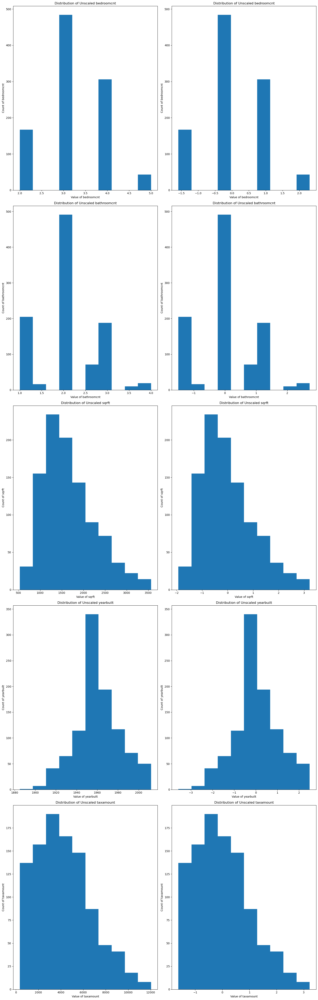

In [65]:
train_sample_scaled = make_and_vis(StandardScaler(), train_sample, cols)

In [66]:
train_sample_scaled.sample()

,bedroomcnt,bathroomcnt,sqrft,assessedvalue,yearbuilt,taxamount,county_Los Angeles,county_Orange,county_Ventura,propertylandusedesc_Inferred Single Family Residential,propertylandusedesc_Single Family Residential,state_California
385469,-0.291845,1.312369,1.610802,511266.0,0.767887,0.730204,0,1,0,0,1,1


In [67]:
train_sample.sample()

,bedroomcnt,bathroomcnt,sqrft,assessedvalue,yearbuilt,taxamount,county_Los Angeles,county_Orange,county_Ventura,propertylandusedesc_Inferred Single Family Residential,propertylandusedesc_Single Family Residential,state_California
1953668,3,3.0,1727.0,418000.0,1992,5675.32,1,0,0,0,1,1


<a id='Q2'></a>
# Question 2:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### 2. Make sure to perform a train, validate, test split before and use only your train dataset to explore the relationships between independent variables with other independent variables or independent variables with your target variable.

In [68]:
train_sample_scaled.columns.to_list()

['bedroomcnt',
 'bathroomcnt',
 'sqrft',
 'assessedvalue',
 'yearbuilt',
 'taxamount',
 'county_Los Angeles',
 'county_Orange',
 'county_Ventura',
 'propertylandusedesc_Inferred Single Family Residential',
 'propertylandusedesc_Single Family Residential',
 'state_California']

In [69]:
train_corr = train_sample_scaled.drop(columns=[
 'propertylandusedesc_Inferred Single Family Residential',
 'propertylandusedesc_Single Family Residential',
 'state_California'
]).corr(method='spearman')

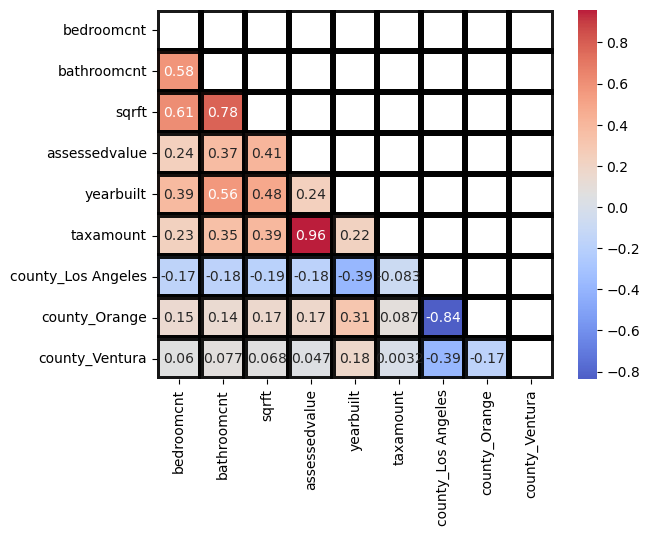

In [70]:
kwargs = {'alpha':.9,
          'linewidth':3, 
          'linestyle':'-',
          'linecolor':'black'}
sns.heatmap(train_corr,
            cmap='coolwarm',
            annot=True,
            mask=np.triu(train_corr),
            **kwargs)
plt.show()

<a id='Q3'></a>
# Question 3:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### 3. Write a function named plot_variable_pairs that accepts a dataframe as input and plots all of the pairwise relationships along with the regression line for each pair.

In [71]:
traincollist = train_sample_scaled.columns.to_list()

In [72]:
combos = list(itertools.combinations(traincollist, 2))
print(combos)

[('bedroomcnt', 'bathroomcnt'), ('bedroomcnt', 'sqrft'), ('bedroomcnt', 'assessedvalue'), ('bedroomcnt', 'yearbuilt'), ('bedroomcnt', 'taxamount'), ('bedroomcnt', 'county_Los Angeles'), ('bedroomcnt', 'county_Orange'), ('bedroomcnt', 'county_Ventura'), ('bedroomcnt', 'propertylandusedesc_Inferred Single Family Residential'), ('bedroomcnt', 'propertylandusedesc_Single Family Residential'), ('bedroomcnt', 'state_California'), ('bathroomcnt', 'sqrft'), ('bathroomcnt', 'assessedvalue'), ('bathroomcnt', 'yearbuilt'), ('bathroomcnt', 'taxamount'), ('bathroomcnt', 'county_Los Angeles'), ('bathroomcnt', 'county_Orange'), ('bathroomcnt', 'county_Ventura'), ('bathroomcnt', 'propertylandusedesc_Inferred Single Family Residential'), ('bathroomcnt', 'propertylandusedesc_Single Family Residential'), ('bathroomcnt', 'state_California'), ('sqrft', 'assessedvalue'), ('sqrft', 'yearbuilt'), ('sqrft', 'taxamount'), ('sqrft', 'county_Los Angeles'), ('sqrft', 'county_Orange'), ('sqrft', 'county_Ventura'), 



bedroomcnt vs. bathroomcnt


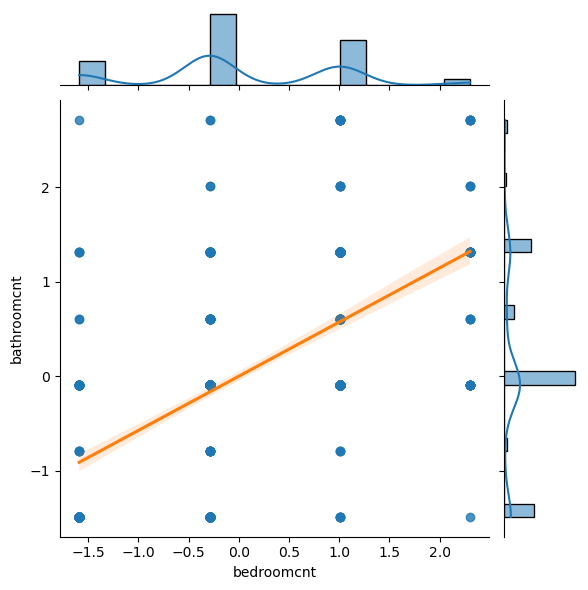



bedroomcnt vs. sqrft


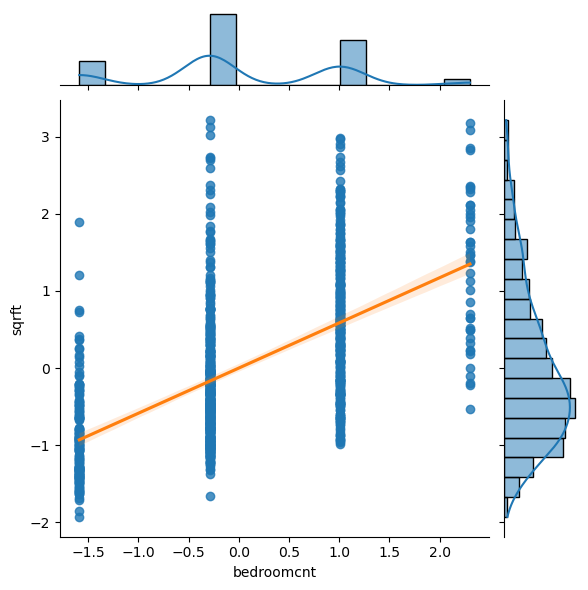



bedroomcnt vs. assessedvalue


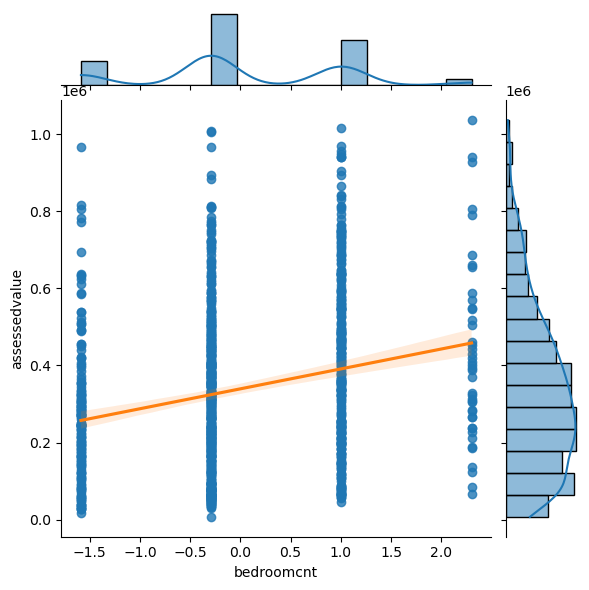



bedroomcnt vs. yearbuilt


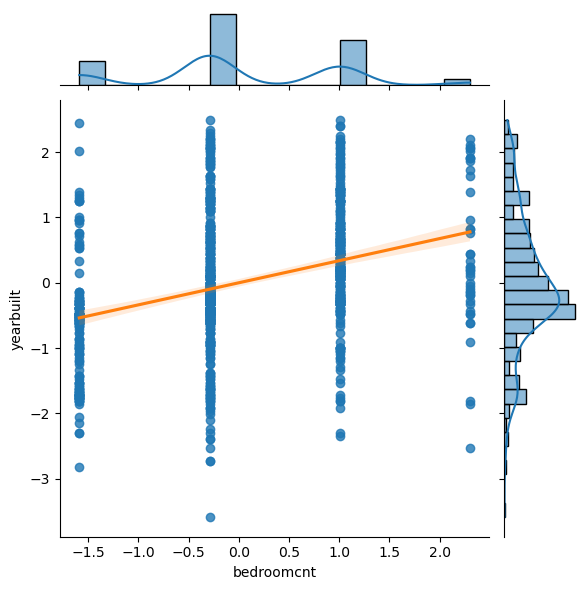



bedroomcnt vs. taxamount


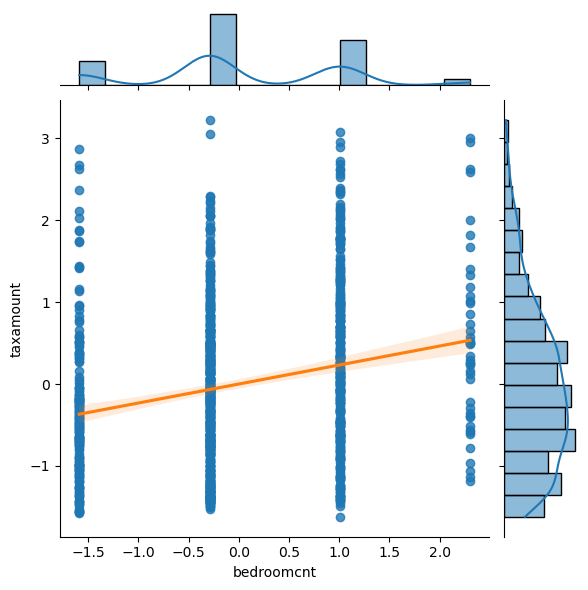



bedroomcnt vs. county_Los Angeles


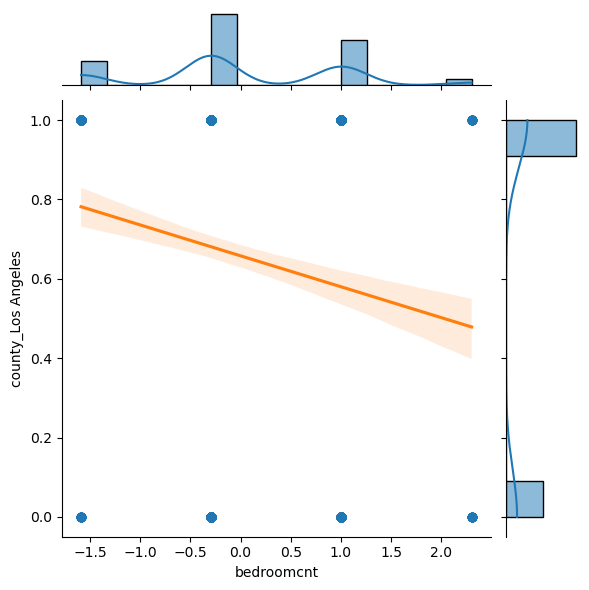



bedroomcnt vs. county_Orange


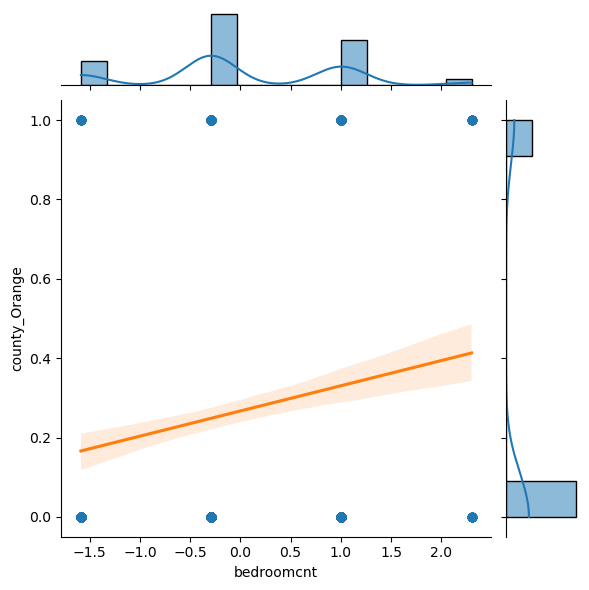



bedroomcnt vs. county_Ventura


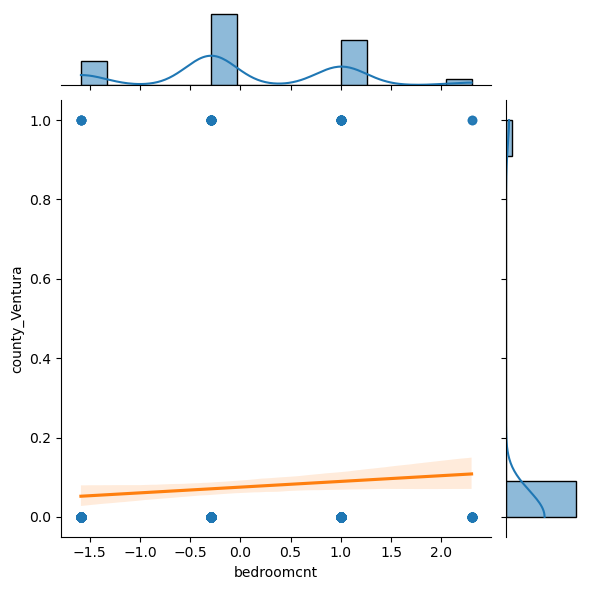



bedroomcnt vs. propertylandusedesc_Inferred Single Family Residential


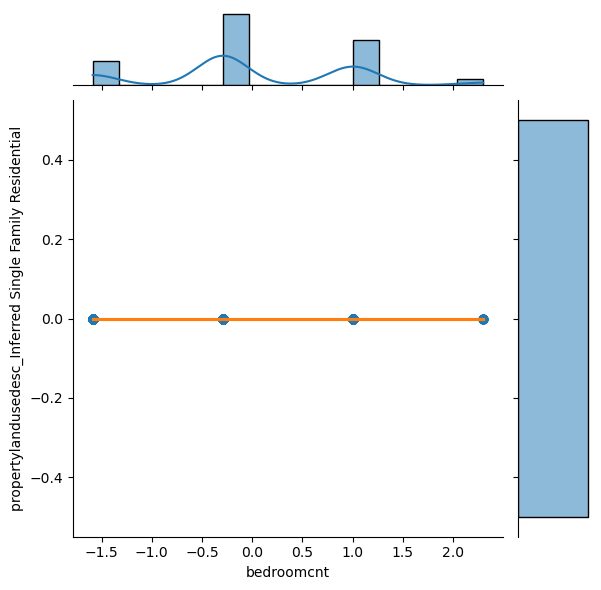



bedroomcnt vs. propertylandusedesc_Single Family Residential


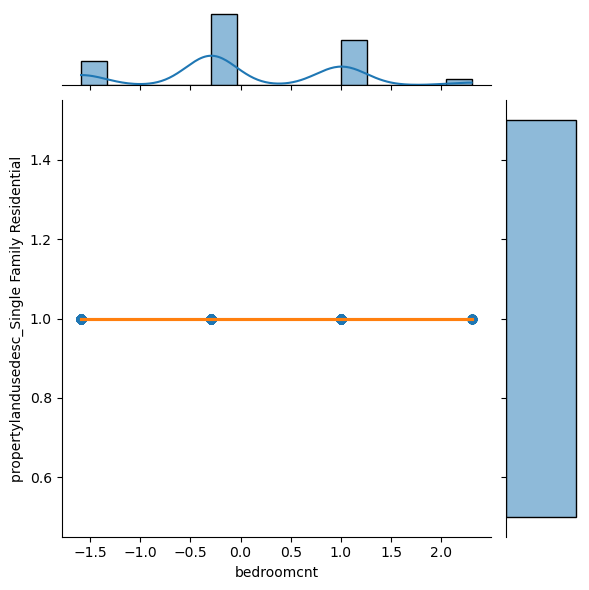



bedroomcnt vs. state_California


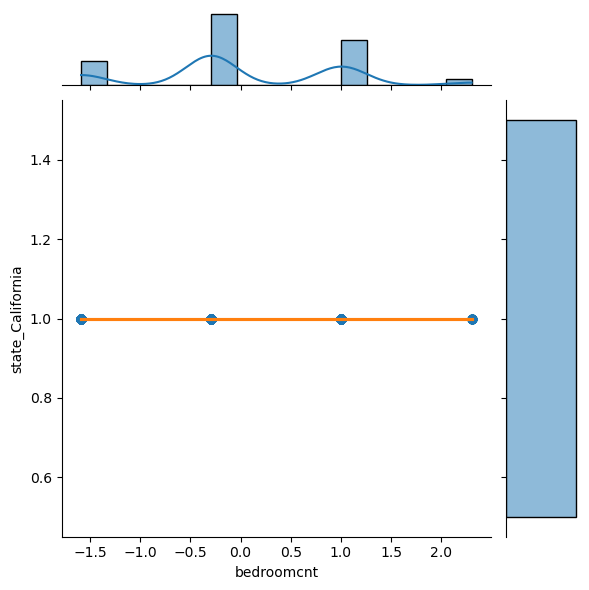



bathroomcnt vs. sqrft


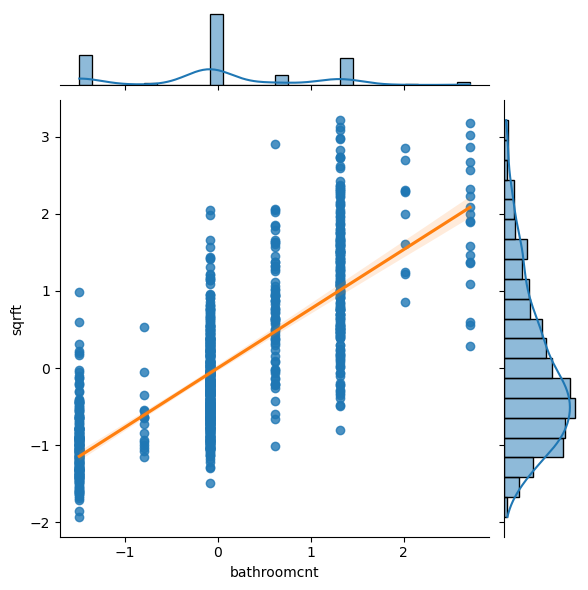



bathroomcnt vs. assessedvalue


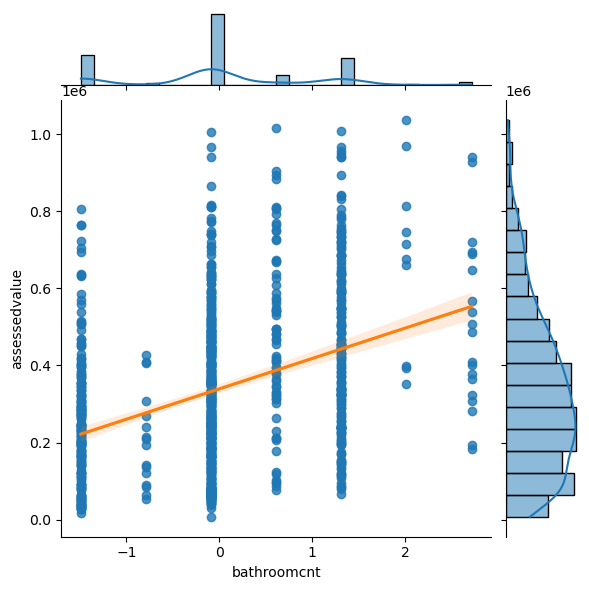



bathroomcnt vs. yearbuilt


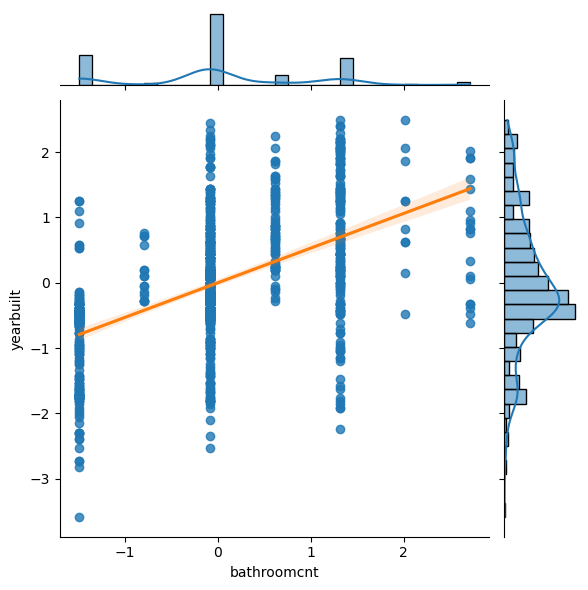



bathroomcnt vs. taxamount


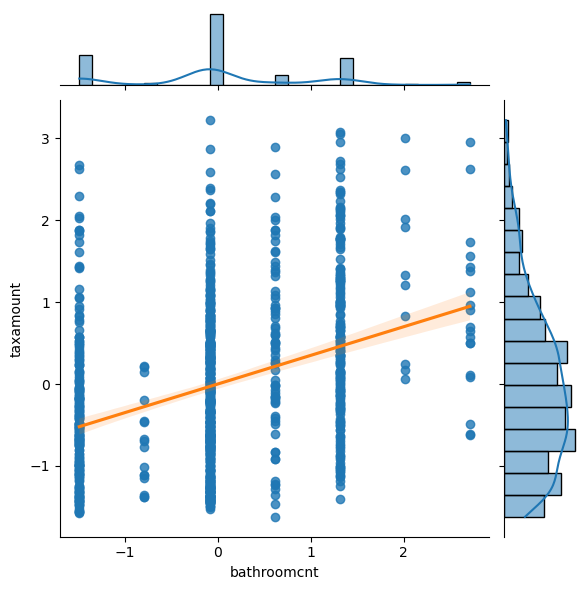



bathroomcnt vs. county_Los Angeles


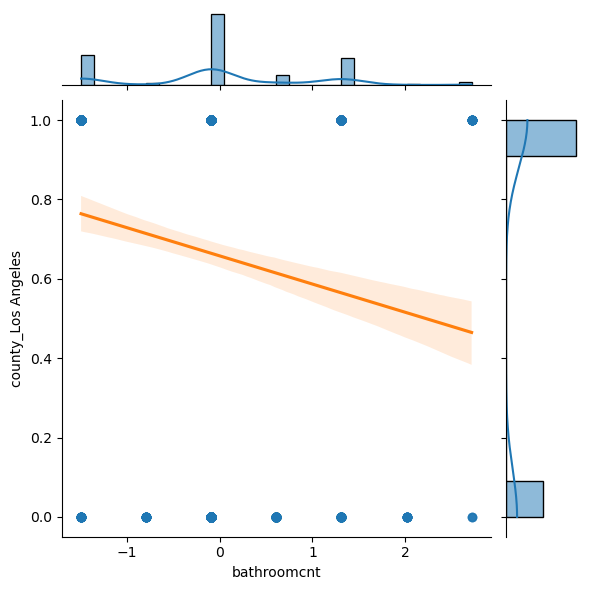



bathroomcnt vs. county_Orange


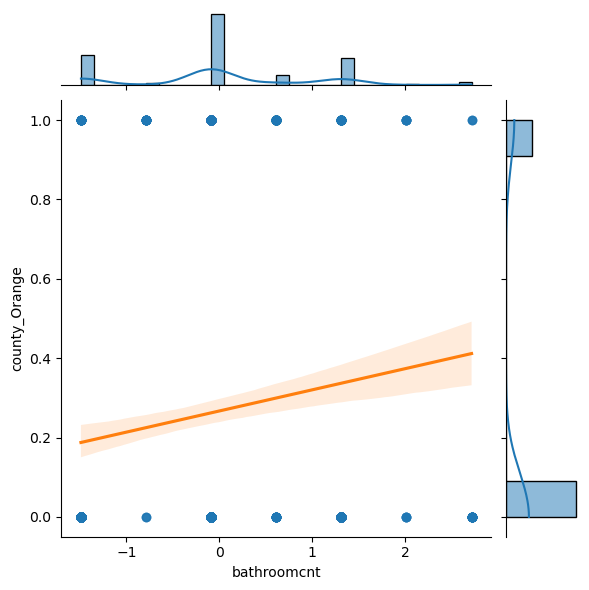



bathroomcnt vs. county_Ventura


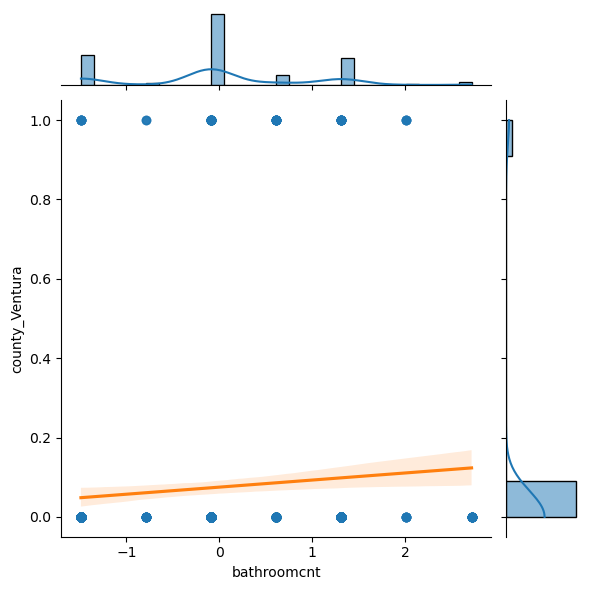



bathroomcnt vs. propertylandusedesc_Inferred Single Family Residential


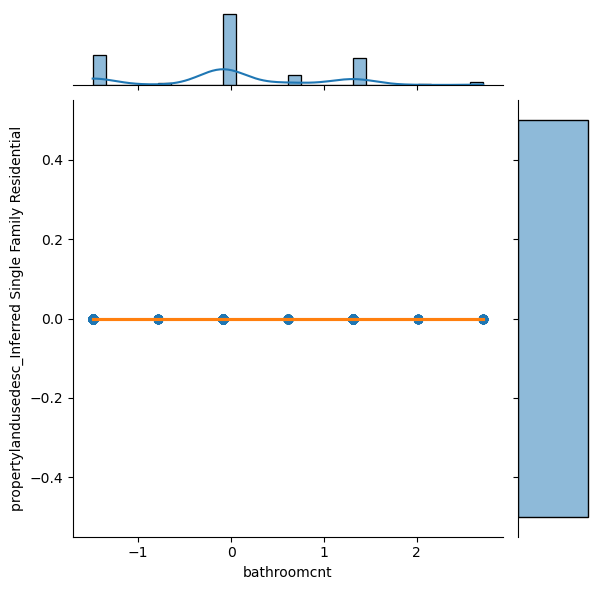



bathroomcnt vs. propertylandusedesc_Single Family Residential


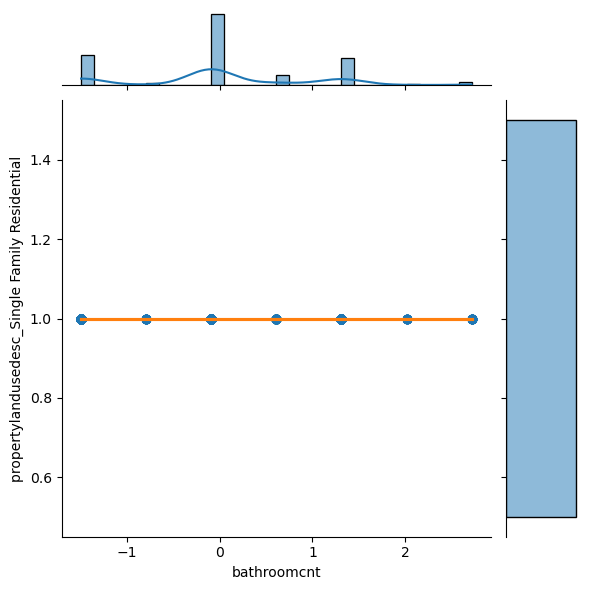



bathroomcnt vs. state_California


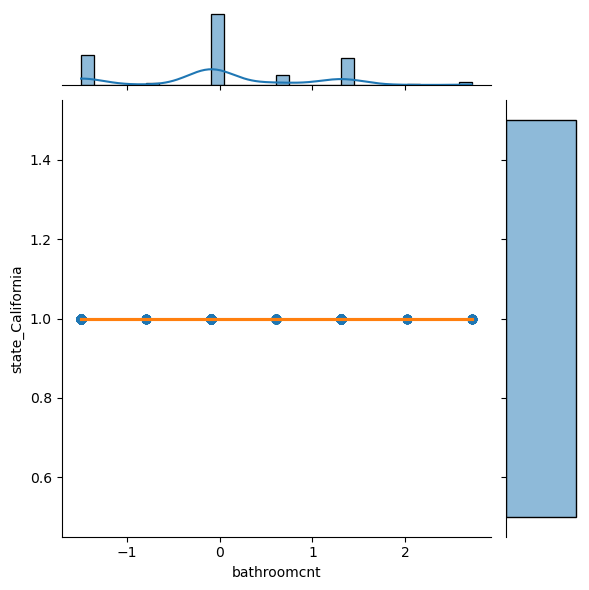



sqrft vs. assessedvalue


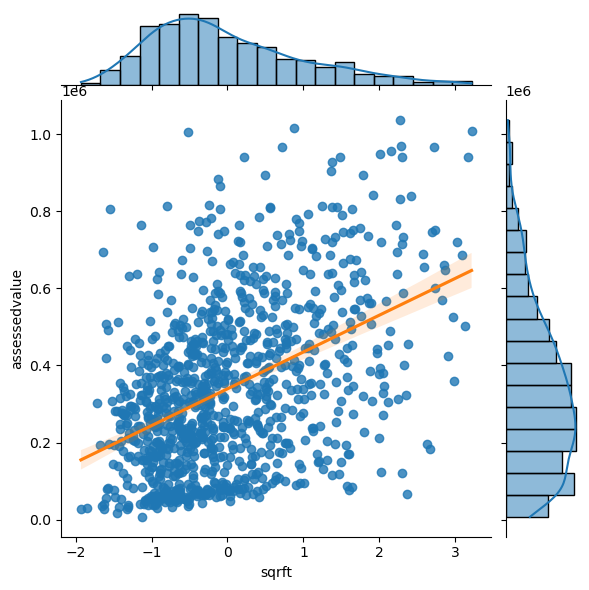



sqrft vs. yearbuilt


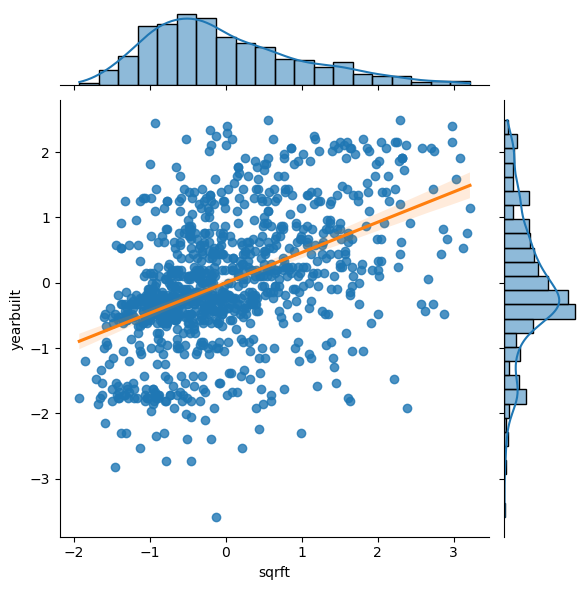



sqrft vs. taxamount


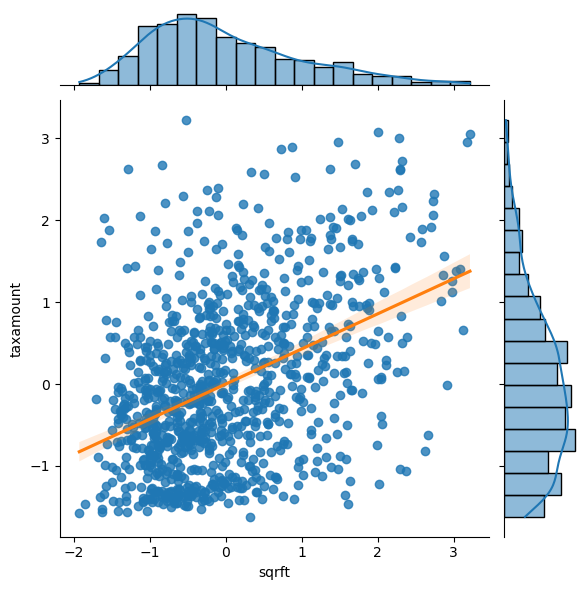



sqrft vs. county_Los Angeles


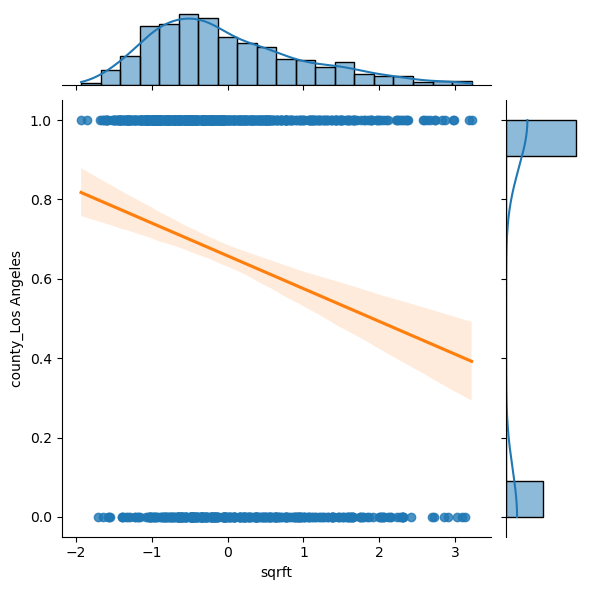



sqrft vs. county_Orange


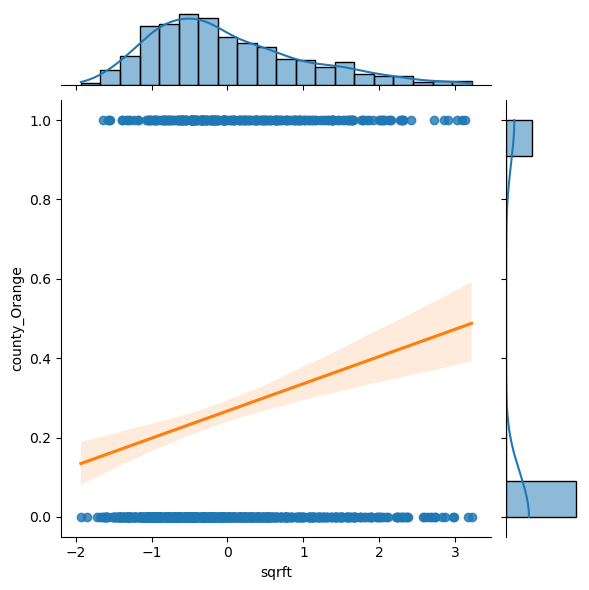



sqrft vs. county_Ventura


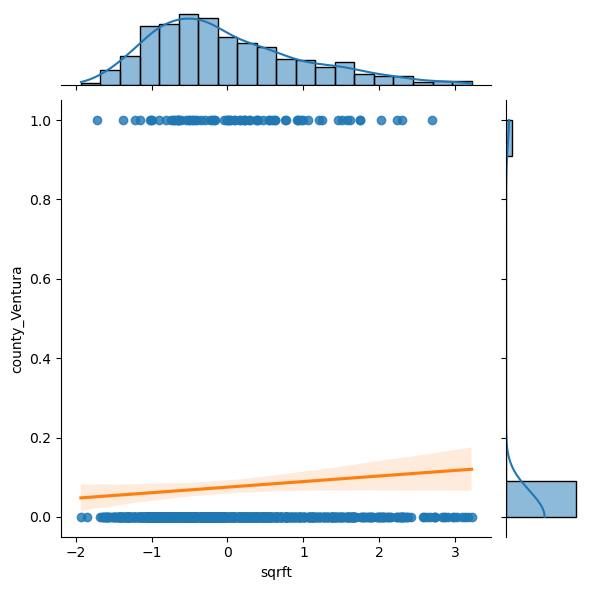



sqrft vs. propertylandusedesc_Inferred Single Family Residential


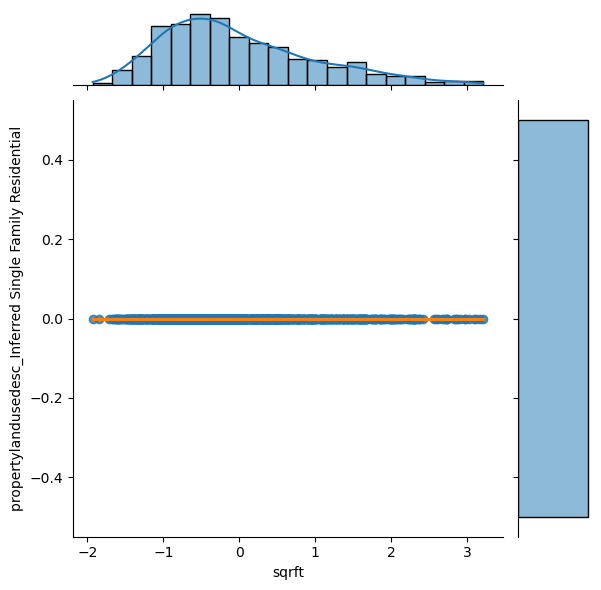



sqrft vs. propertylandusedesc_Single Family Residential


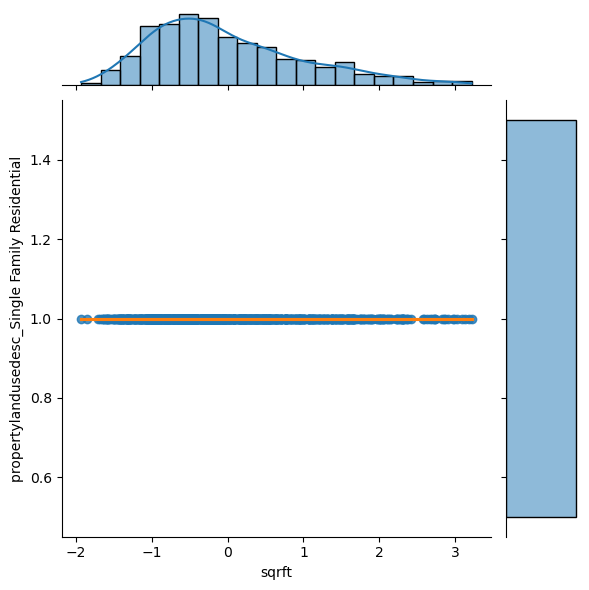



sqrft vs. state_California


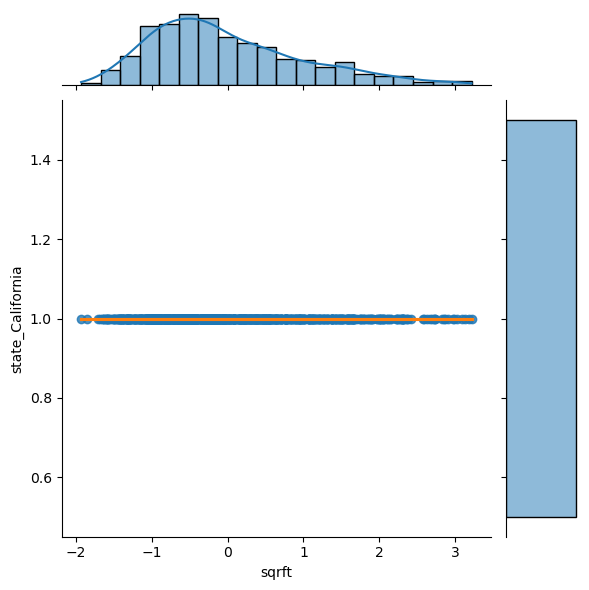



assessedvalue vs. yearbuilt


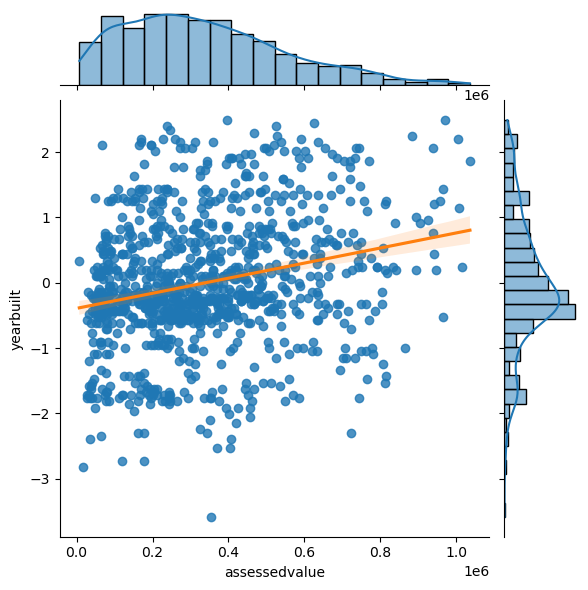



assessedvalue vs. taxamount


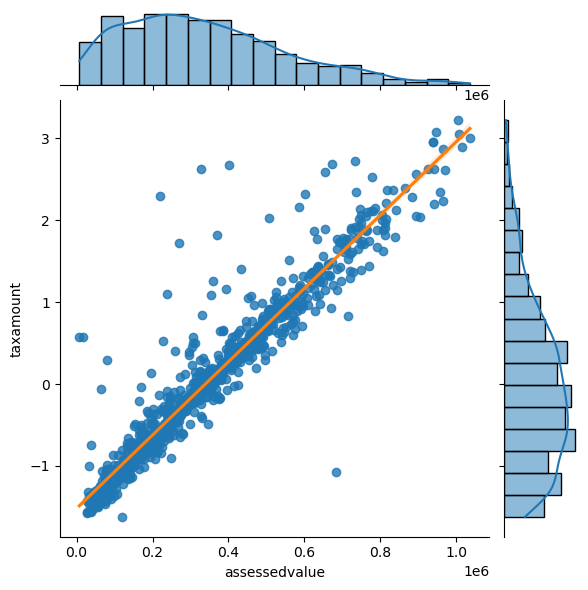



assessedvalue vs. county_Los Angeles


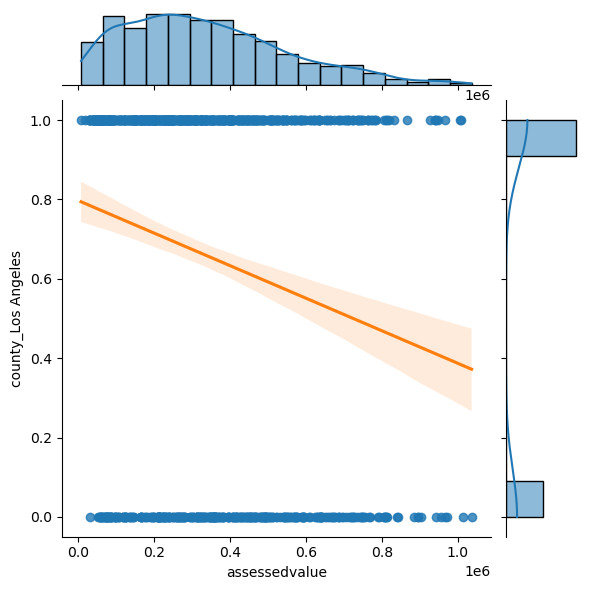



assessedvalue vs. county_Orange


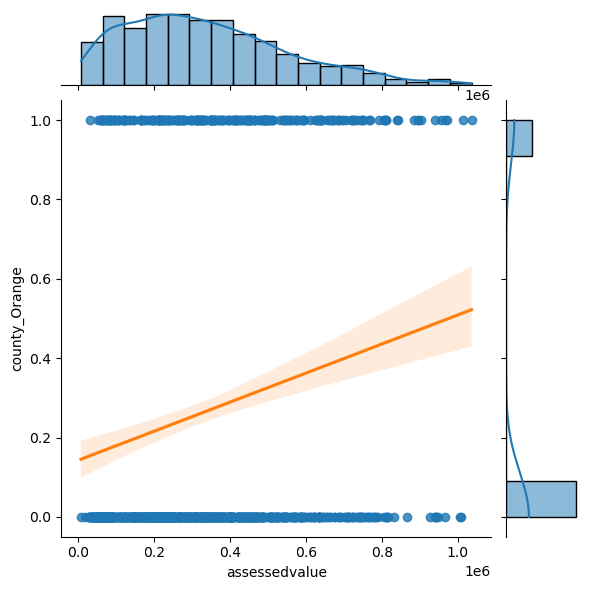



assessedvalue vs. county_Ventura


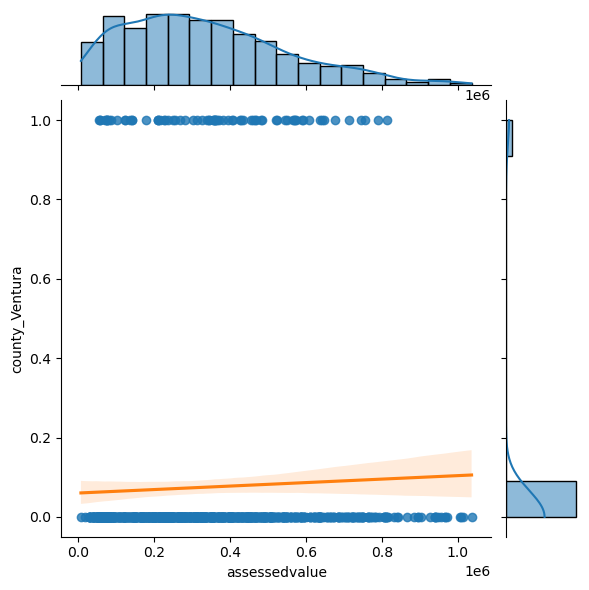



assessedvalue vs. propertylandusedesc_Inferred Single Family Residential


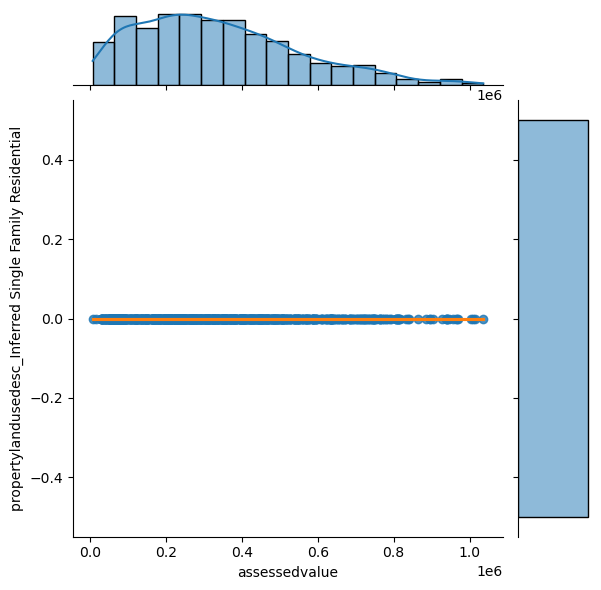



assessedvalue vs. propertylandusedesc_Single Family Residential


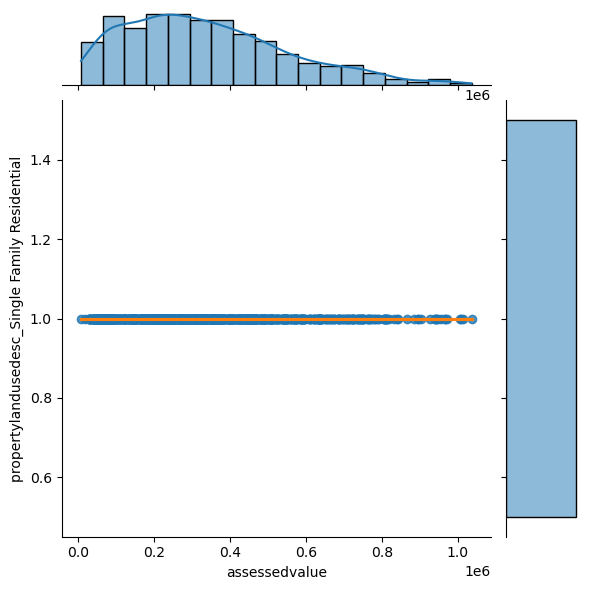



assessedvalue vs. state_California


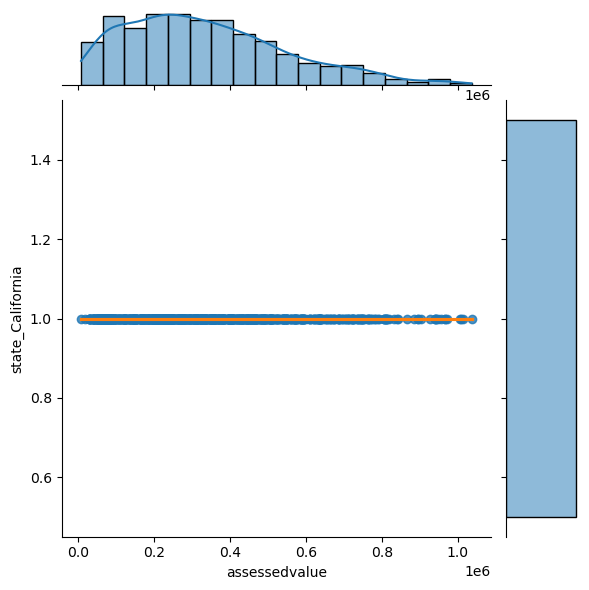



yearbuilt vs. taxamount


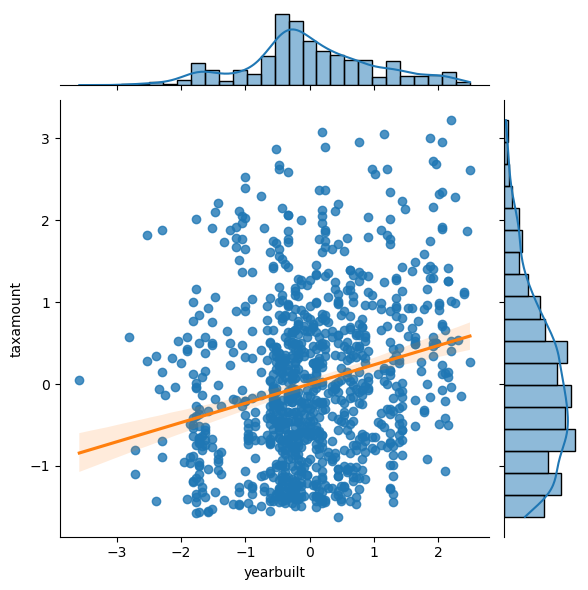



yearbuilt vs. county_Los Angeles


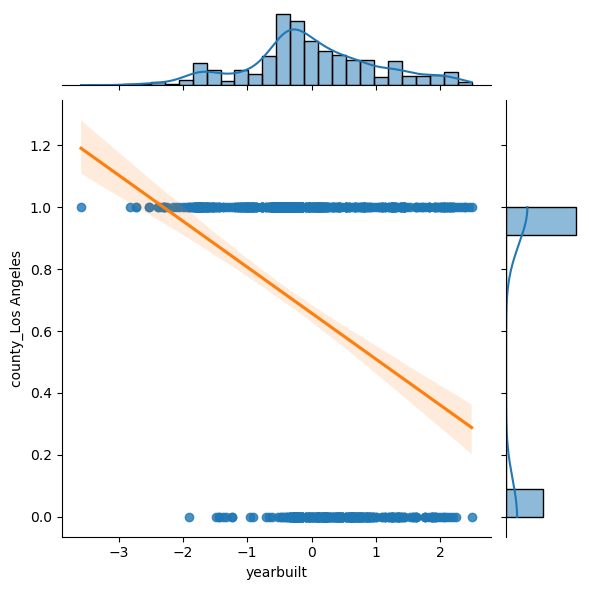



yearbuilt vs. county_Orange


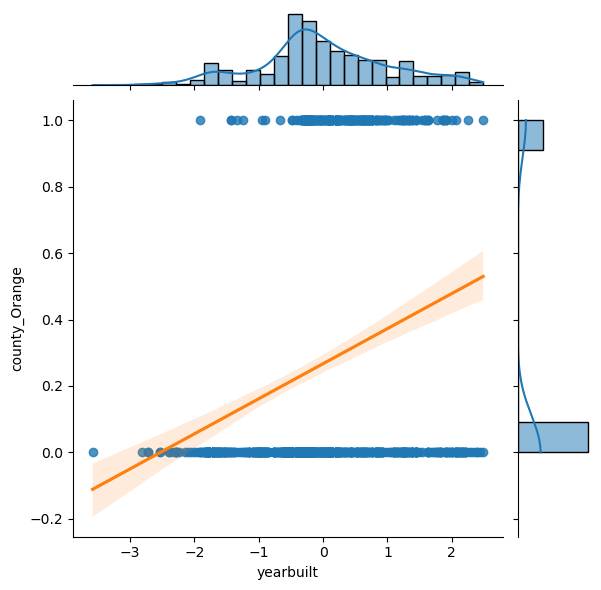



yearbuilt vs. county_Ventura


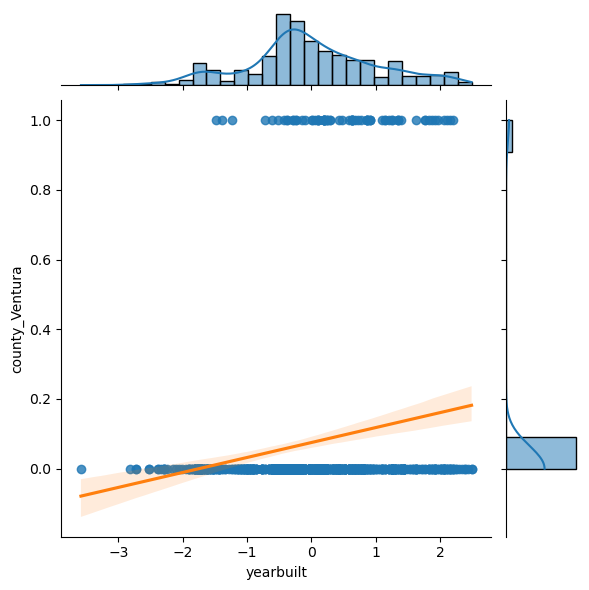



yearbuilt vs. propertylandusedesc_Inferred Single Family Residential


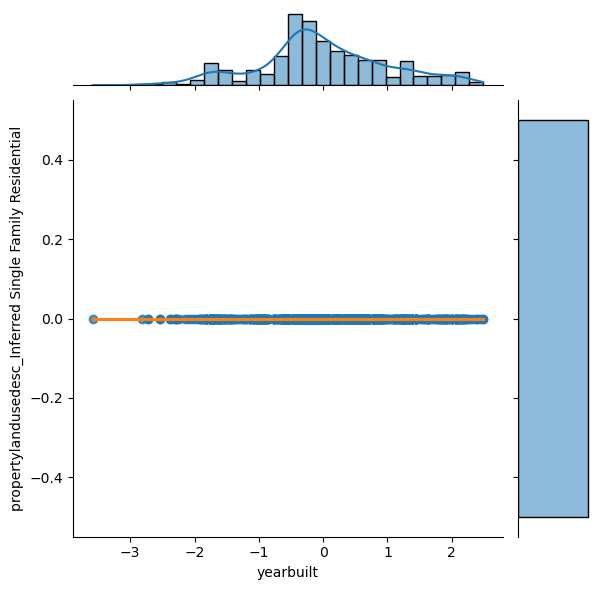



yearbuilt vs. propertylandusedesc_Single Family Residential


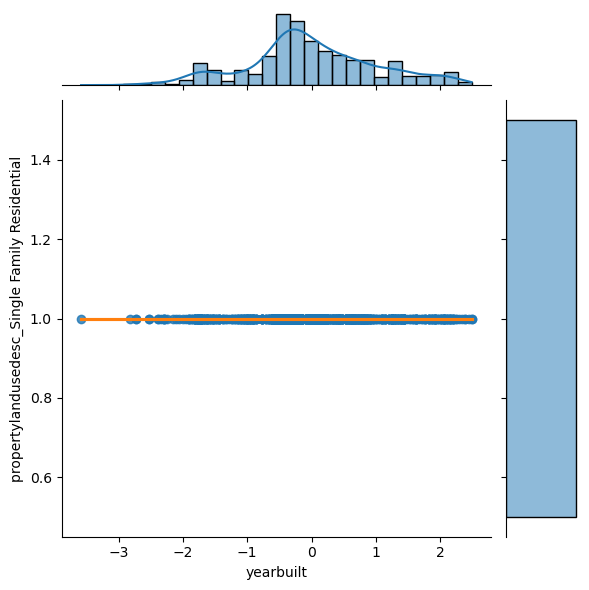



yearbuilt vs. state_California


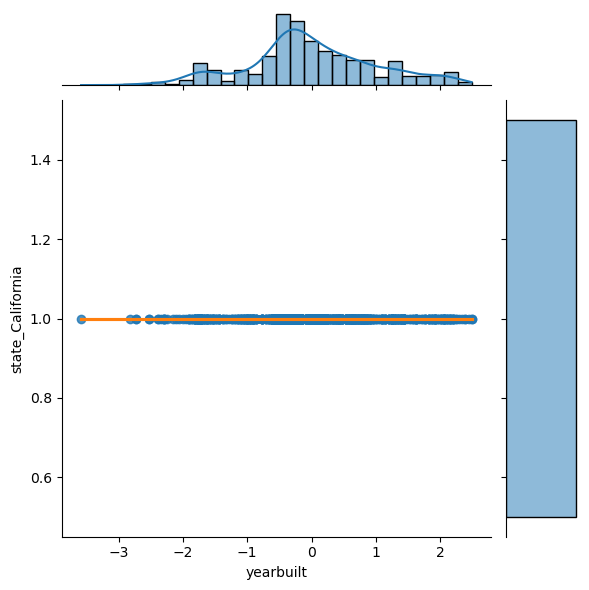



taxamount vs. county_Los Angeles


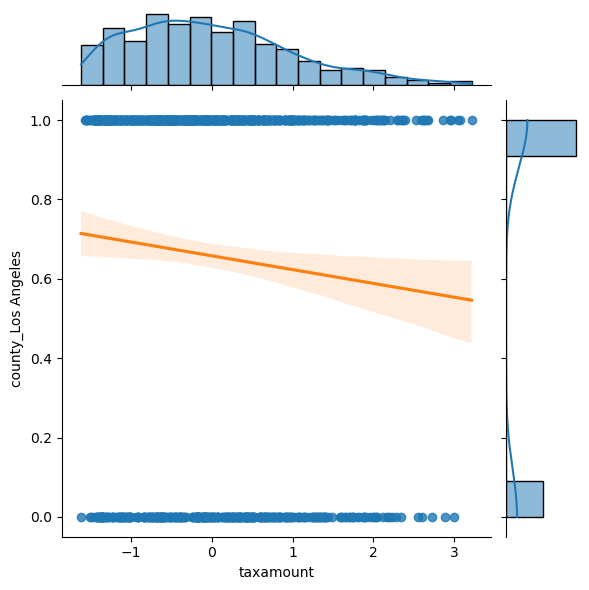



taxamount vs. county_Orange


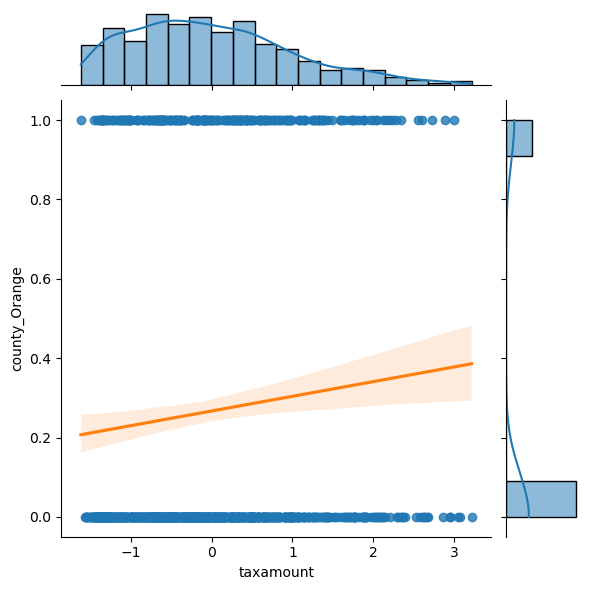



taxamount vs. county_Ventura


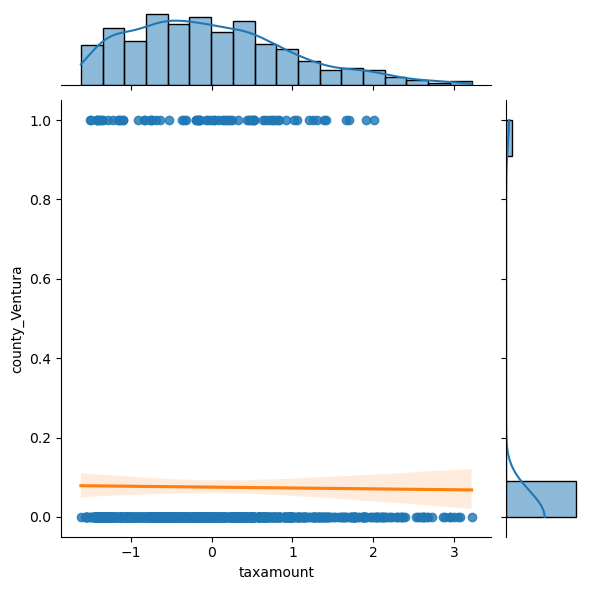



taxamount vs. propertylandusedesc_Inferred Single Family Residential


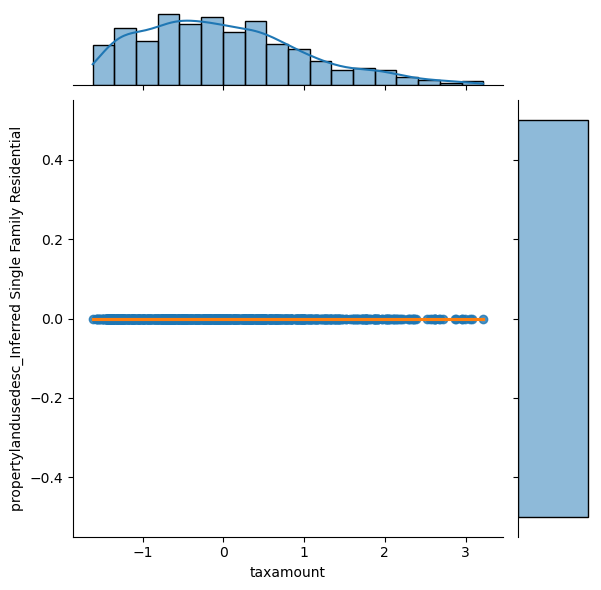



taxamount vs. propertylandusedesc_Single Family Residential


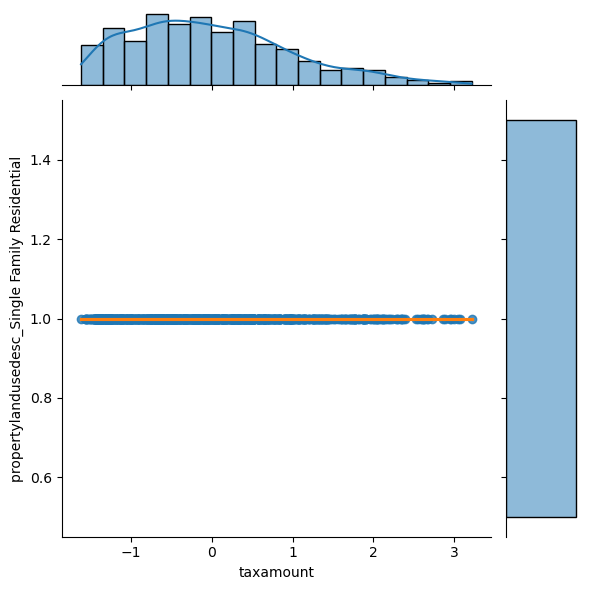



taxamount vs. state_California


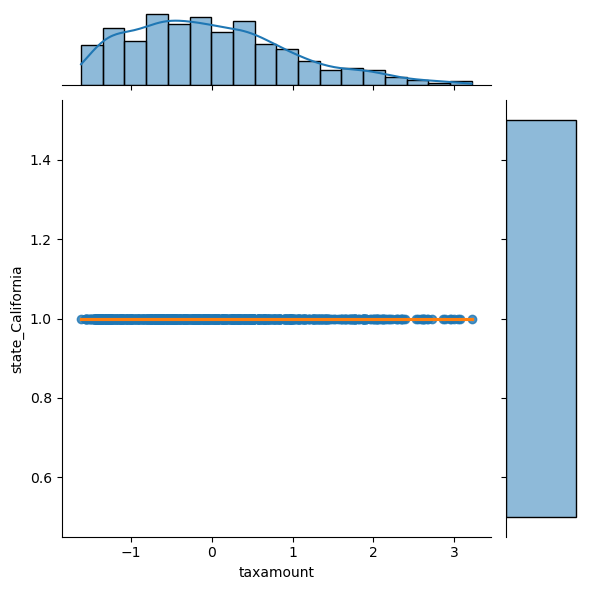



county_Los Angeles vs. county_Orange


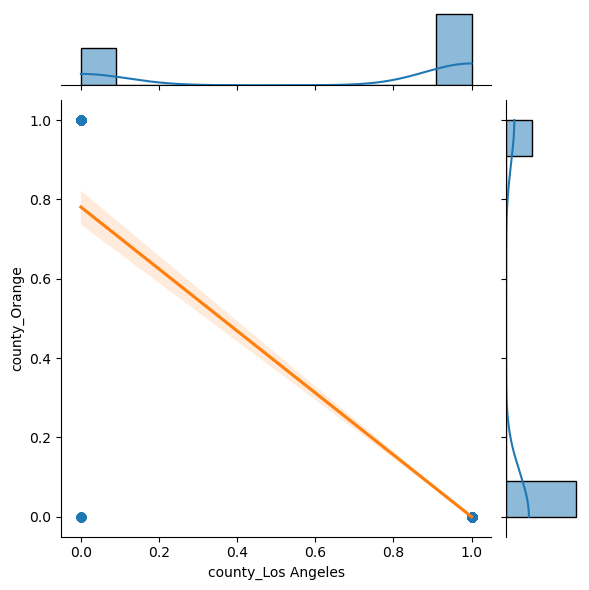



county_Los Angeles vs. county_Ventura


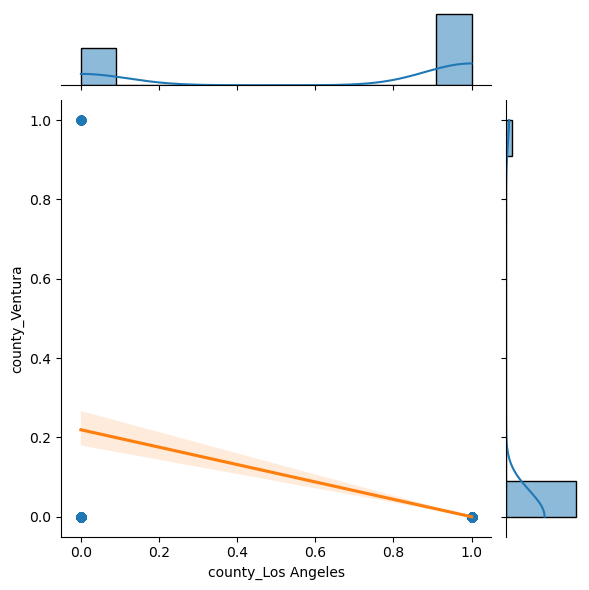



county_Los Angeles vs. propertylandusedesc_Inferred Single Family Residential


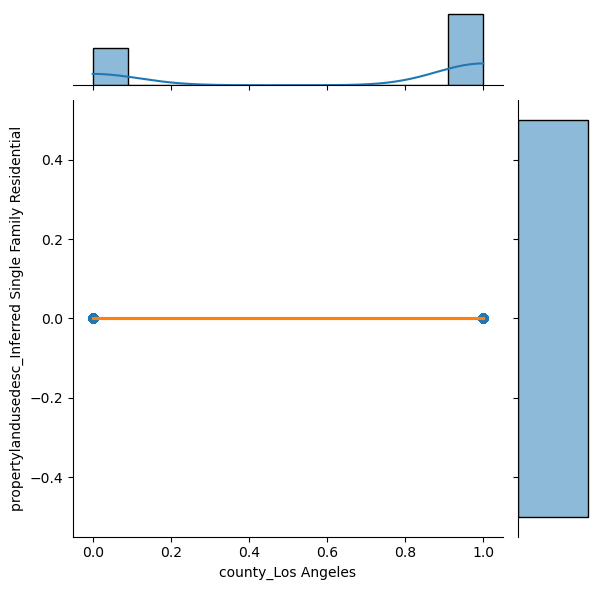



county_Los Angeles vs. propertylandusedesc_Single Family Residential


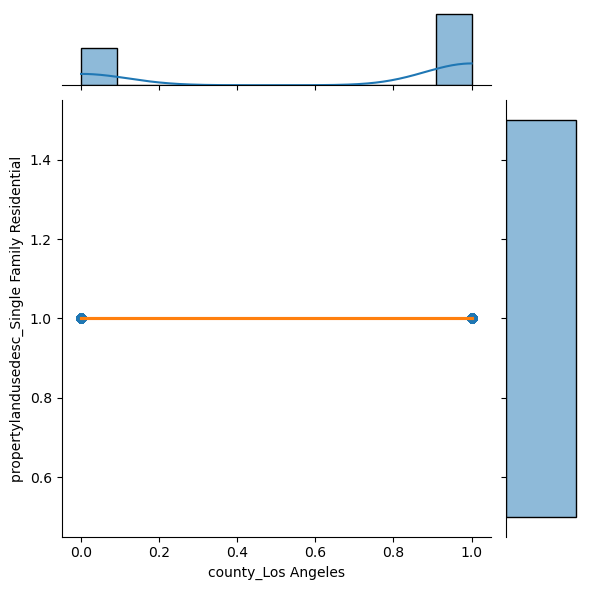



county_Los Angeles vs. state_California


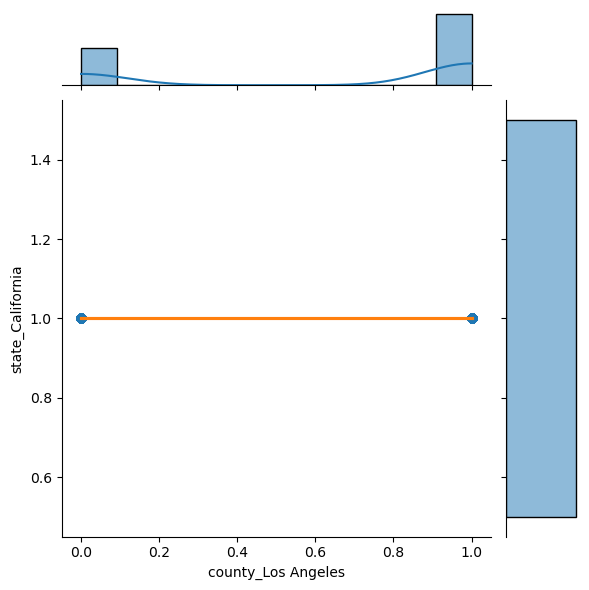



county_Orange vs. county_Ventura


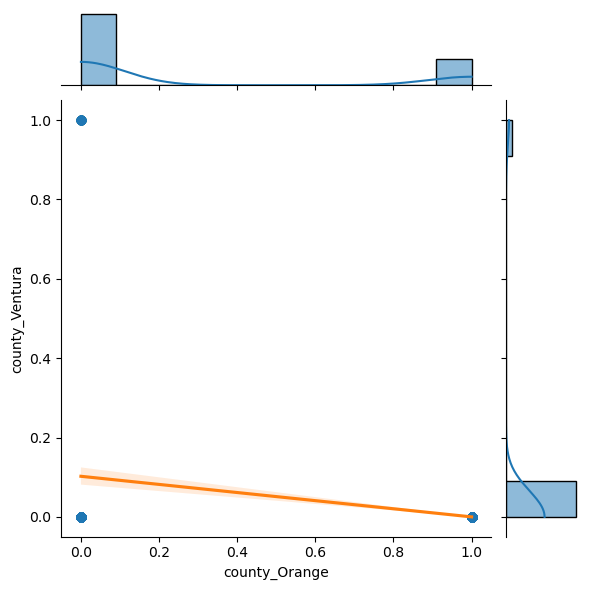



county_Orange vs. propertylandusedesc_Inferred Single Family Residential


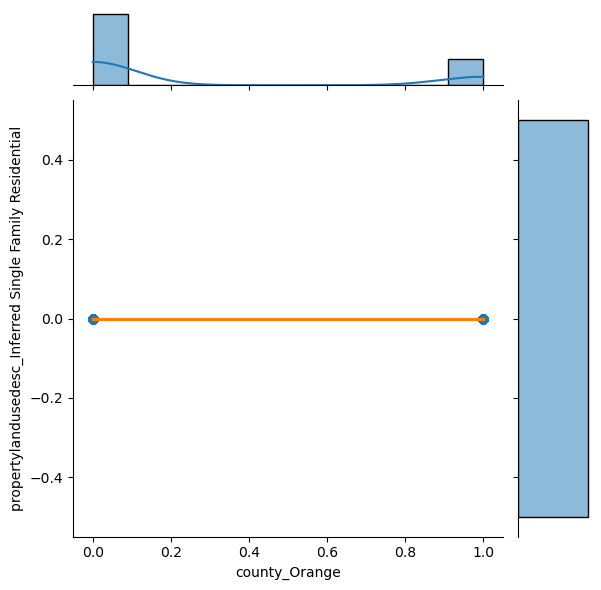



county_Orange vs. propertylandusedesc_Single Family Residential


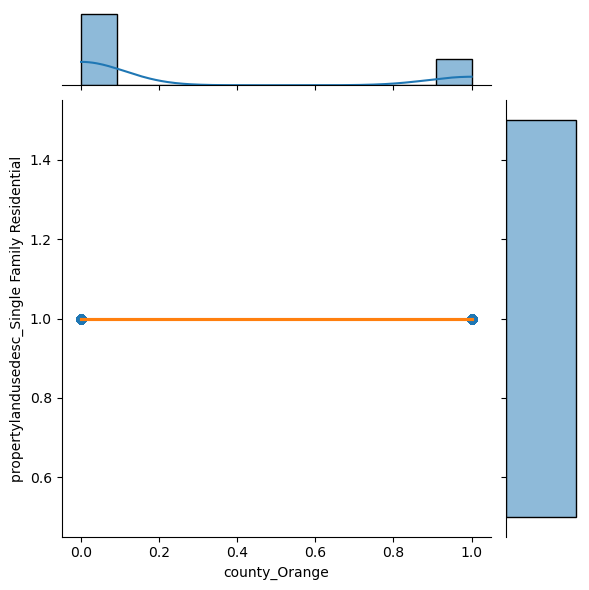



county_Orange vs. state_California


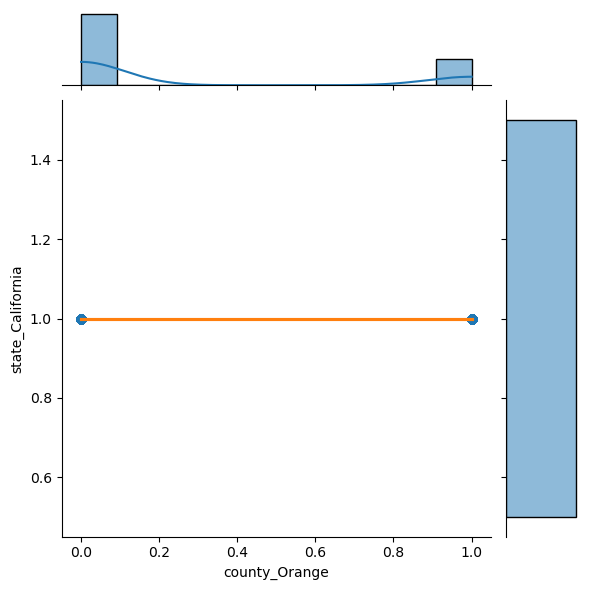



county_Ventura vs. propertylandusedesc_Inferred Single Family Residential


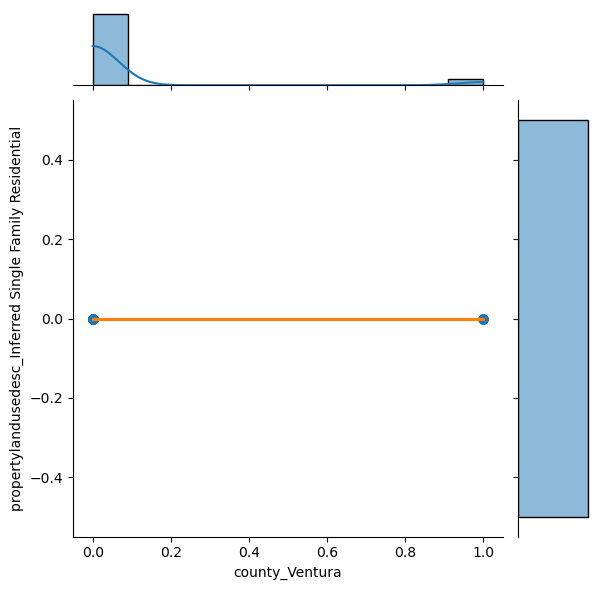



county_Ventura vs. propertylandusedesc_Single Family Residential


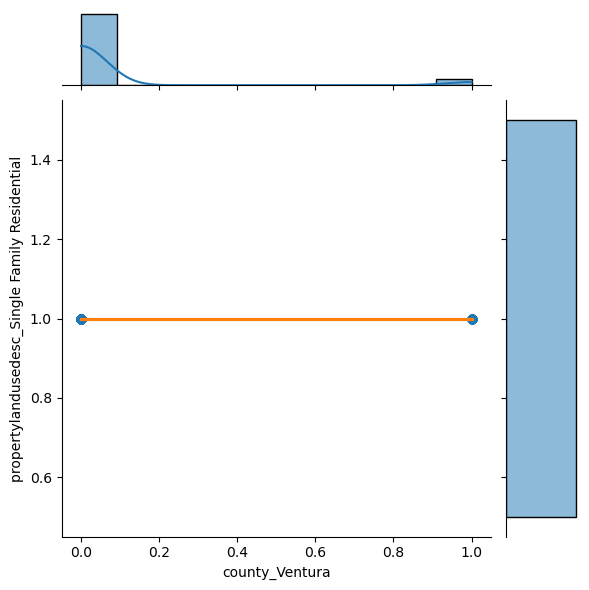



county_Ventura vs. state_California


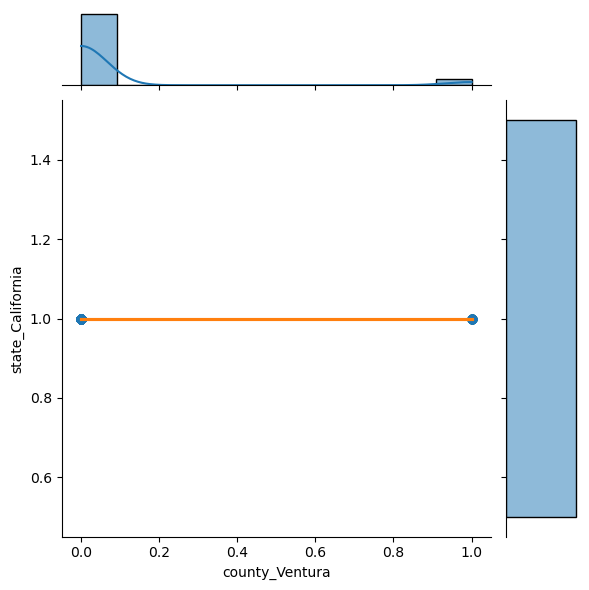



propertylandusedesc_Inferred Single Family Residential vs. propertylandusedesc_Single Family Residential


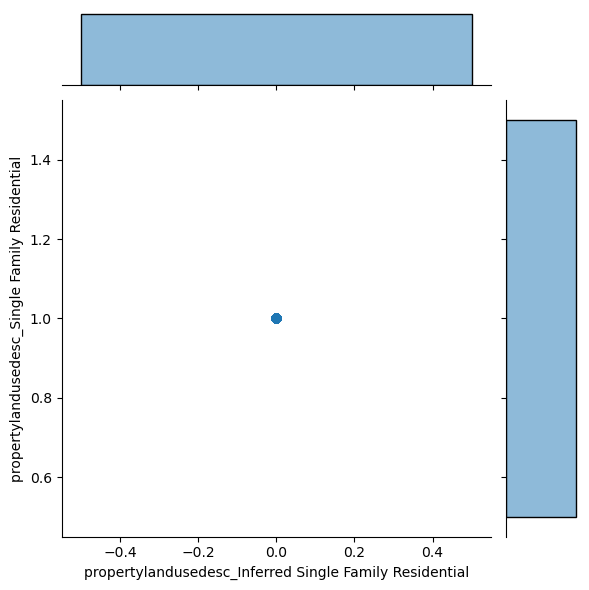



propertylandusedesc_Inferred Single Family Residential vs. state_California


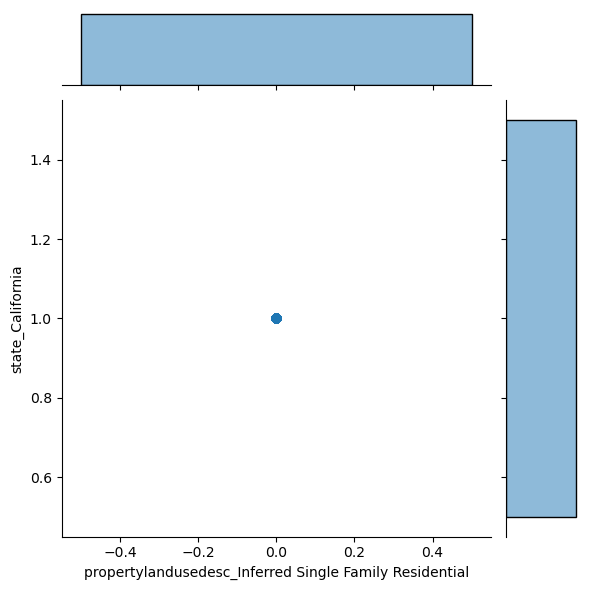



propertylandusedesc_Single Family Residential vs. state_California


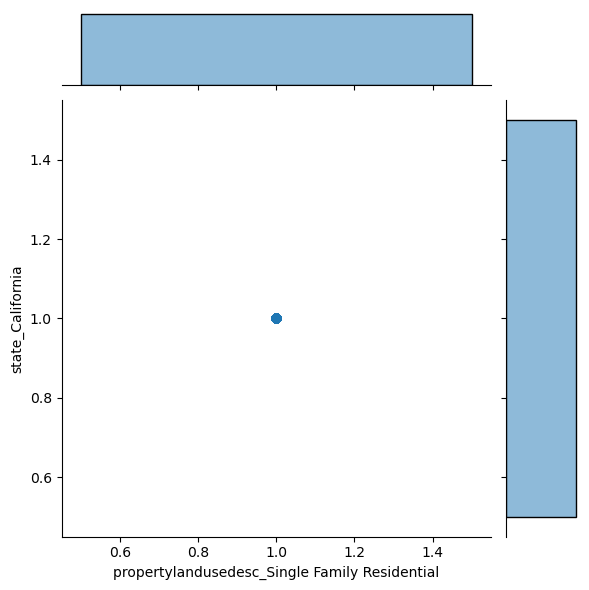

In [73]:
for combo in combos:
    print(f'\n\n\033[32m{combo[0]} vs. {combo[1]}\033[0m')
    sns.jointplot(data=train_sample_scaled, x=train_sample_scaled[combo[0]], y=train_sample_scaled[combo[1]], line_kws={'color':'C1'}, kind='reg')
    plt.show()

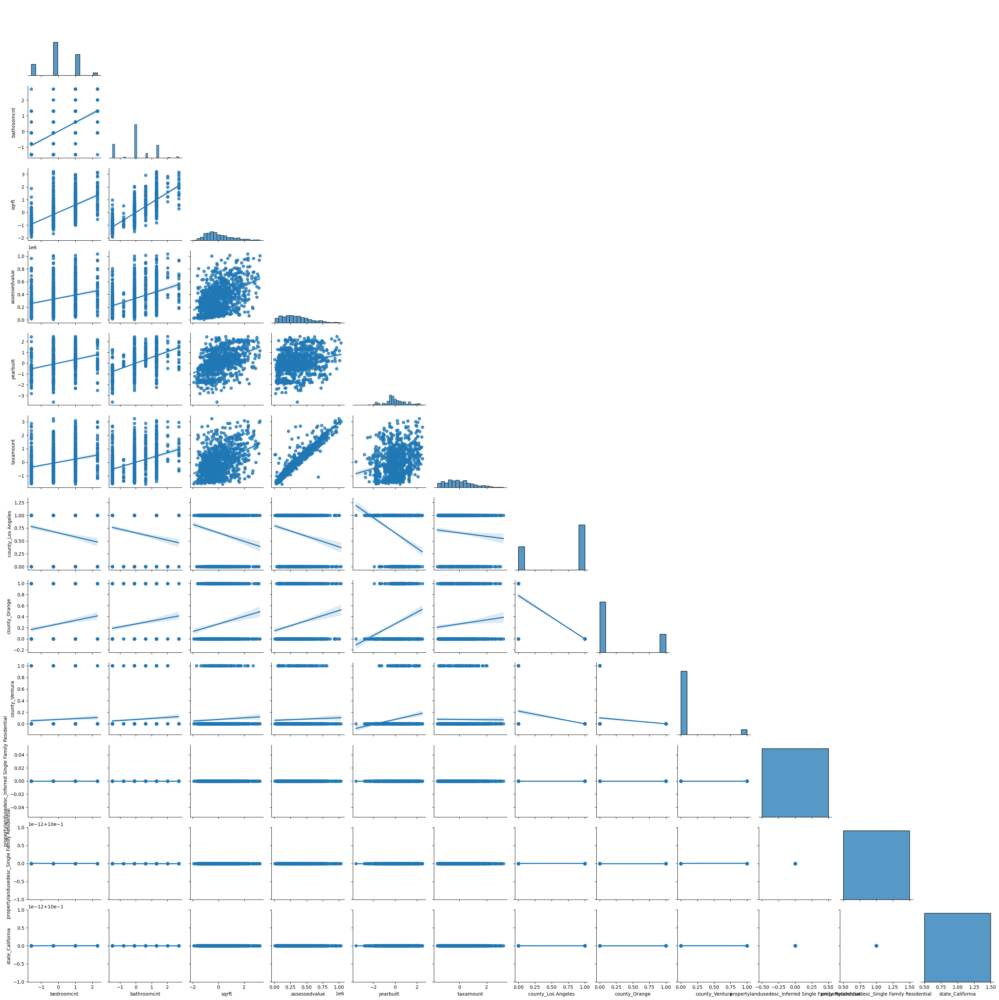

In [74]:
sns.pairplot(data=train_sample_scaled, corner=True, kind='reg')
plt.show()

<a id='Q4'></a>
# Question 4:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### 4. Write a function named plot_categorical_and_continuous_vars that accepts your dataframe and the name of the columns that hold the continuous and categorical features and outputs 3 different plots for visualizing a categorical variable and a continuous variable.

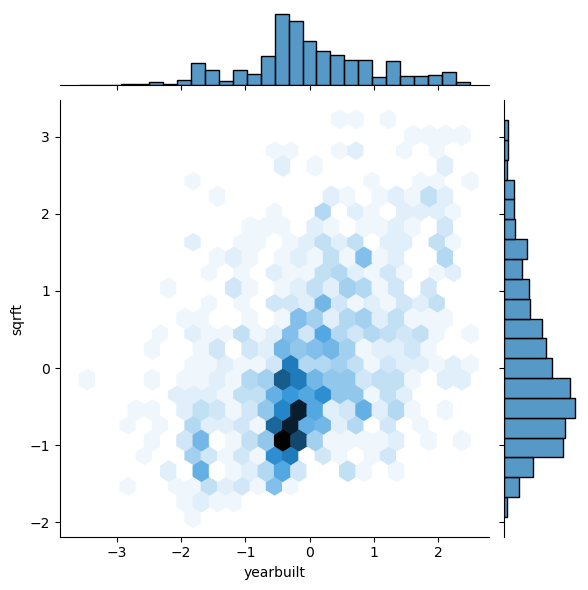

In [86]:
sns.jointplot(data=train_sample_scaled, x='yearbuilt', y='sqrft', kind='hex')
plt.show()

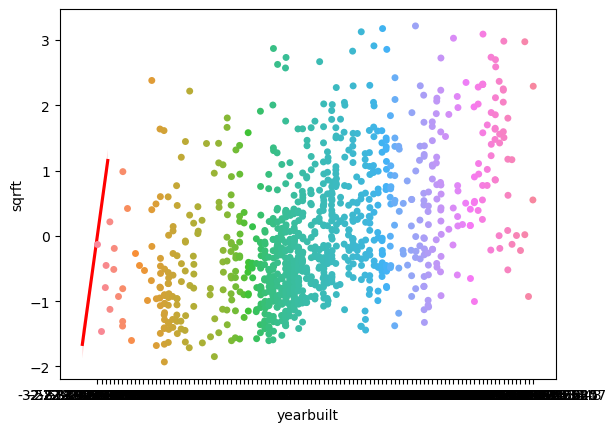

In [76]:
sns.stripplot(data=train_sample_scaled, x='yearbuilt', y='sqrft')
sns.regplot(x='yearbuilt', y='sqrft', data=train_sample_scaled, scatter=False, color='red')
plt.show()

In [92]:
def vis3_catandcont(data, figsize1, figsize2):
    categorical_cols = []
    continuous_cols = []
    for col in data:
        if (data[col].nunique() / data.shape[0]) < 0.15:
            categorical_cols.append(col)
        else:
            continuous_cols.append(col)
    combo_list = list(itertools.product(categorical_cols, continuous_cols))
    fig, axs = plt.subplots(len(combo_list), 3, figsize=(figsize1, figsize2))
    for (ax1, ax2, ax3), combo in zip(axs, combo_list):
        sns.violinplot(data=data, x=combo[0], y=combo[1], ax=ax1)
        ax1.set(title=f'{combo[0]} vs. {combo[1]}',
                xlabel=f'{combo[0]}',
                ylabel=f'{combo[1]}')
        sns.regplot(data=data, x=combo[0], y=combo[1], color='red', ax=ax2)
        ax2.set(title=f'{combo[0]} vs. {combo[1]}',
                xlabel=f'{combo[0]}',
                ylabel=f'{combo[1]}')
        sns.swarmplot(data=data, x=combo[0], y=combo[1], ax=ax3)
        ax3.set(title=f'{combo[0]} vs. {combo[1]}',
                xlabel=f'{combo[0]}',
                ylabel=f'{combo[1]}')
    plt.tight_layout()
    plt.show()

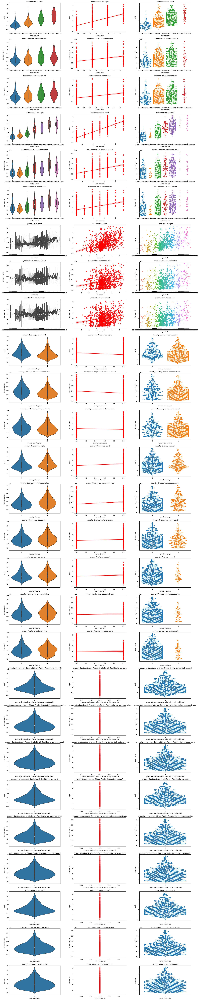

In [93]:
vis3_catandcont(train_sample_scaled, 20, 100)

<a id='Q5'></a>
# Question 5:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### 5. Save the functions you have written to create visualizations in your explore.py file. Rewrite your notebook code so that you are using the functions imported from this file.

<a id='Q6'></a>
# Question 6:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### 6. Use the functions you created above to explore your Zillow train dataset in your explore.ipynb notebook.

<a id='Q7'></a>
# Question 7:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### 7. Come up with some initial hypotheses based on your goal of predicting property value.

<a id='Q8'></a>
# Question 8:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### 8. Visualize all combinations of variables in some way.

<a id='Q9'></a>
# Question 9:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### 9. Run the appropriate statistical tests where needed.

<a id='Q10'></a>
# Question 10:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### 10. What independent variables are correlated with the dependent variable, home value?

<a id='Q11'></a>
# Question 11:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### 11. Which independent variables are correlated with other independent variables (bedrooms, bathrooms, year built, square feet)?

<a id='Q12'></a>
# Question 12:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### 12. Make sure to document your takeaways from visualizations and statistical tests as well as the decisions you make throughout your process.

<a id='Q13'></a>
# Question 13:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### 13. Explore your dataset with any other visualizations you think will be helpful.

<a id='bonus1'></a>
# Bonus Question 1:
<li><a href='#TableOfContents'>Table of Contents</a></li>

### Bonus - 1. In a seperate notebook called explore_mall, use the functions you have developed in this exercise with the mall_customers dataset in the Codeup database server. You will need to write a sql query to acquire your data. Make spending_score your target variable.

In [1]:
print('\033[31mNEED TO DO (MAKE NEW NOTEBOOK)\033[0m')

NEED TO DO (MAKE NEW NOTEBOOK)
